# Homography Estimation

A complete pipeline for planar homography estimation, panorama stitching, and augmented reality compositing.

## Environment setup

We'll start by importing the project modules used in this project and by defining a few helper utilities for visualization.

In [ ]:
import math
import random
from dataclasses import dataclass, field
from pathlib import Path
from typing import Dict, List, Optional, Sequence, Tuple

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import HTML, Video

DATA_ROOT = Path.cwd()
PANORAMA_ROOT = DATA_ROOT / "panorama_dataset"
AR_ROOT = DATA_ROOT / "ar_dataset"
RESULTS_ROOT = DATA_ROOT / "panorama_results"
RESULTS_ROOT.mkdir(exist_ok=True)

plt.style.use("seaborn-v0_8-darkgrid")

def bgr_to_rgb(image: np.ndarray) -> np.ndarray:
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

def show_image(image: np.ndarray, title: str = "", figsize=(8, 5)):
    plt.figure(figsize=figsize)
    plt.imshow(bgr_to_rgb(image))
    plt.title(title)
    plt.axis("off")
    plt.show()

## 1. Methods: Core Utilities

This section defines the core functions used throughout this project, including homography estimation with RANSAC, feature matching, and image warping.

### 3.1. Homography Estimation (DLT + RANSAC)

We manually implement the homography estimation pipeline. This involves two key functions: `dlt_homography` and `ransac_homography`.

**Normalization:**
Before applying the DLT algorithm, we normalize the source and destination points. The `normalize_points` function translates the points so their centroid is at the origin (0,0) and scales them so their average distance from the origin is $\sqrt{2}$. This normalization is crucial for **numerical stability**, as it conditions the matrix $A$ used in the DLT calculation, preventing issues with floating-point precision.

**Direct Linear Transform (DLT):**
The `dlt_homography` function computes the 3x3 homography matrix $H$ from a set of 4 or more point correspondences. It constructs the $2n \times 9$ matrix $A$ based on the normalized point pairs ($p_i' = H p_i$). The solution for $H$ (in homogeneous coordinates) is the right singular vector corresponding to the smallest singular value of $A$, found using Singular Value Decomposition (SVD). Finally, the function denormalizes the computed matrix $H_{norm}$ to get the final homography matrix $H = T_{dst}^{-1} H_{norm} T_{src}$.

**RANSAC (RANdom SAmple Consensus):**
The `ransac_homography` function provides a robust estimation by rejecting outliers. It iteratively:
1.  Selects a minimal sample of 4 point correspondences.
2.  Computes a candidate homography $H_{candidate}$ using DLT.
3.  Calculates the reprojection error for all points using this $H_{candidate}$.
4.  Identifies inliers as points where the error is below a `threshold` (e.g., 3.0 pixels).
5.  If this model has the most inliers so far, it is refined by re-computing $H_{refined}$ using DLT on *all* its inliers.
6.  This refined model is saved as the best model, and the number of iterations is dynamically adjusted based on the current inlier ratio to meet the desired `confidence`.

This process ensures the final homography is not skewed by incorrect feature matches.

In [ ]:
# ========== Homography Utilities ==========
@dataclass
class HomographyResult:
    H: np.ndarray
    inlier_mask: np.ndarray
    num_inliers: int
    num_matches: int
    reprojection_error: float

    @property
    def inlier_ratio(self) -> float:
        return float(self.num_inliers) / float(max(self.num_matches, 1))


def _prepare_points(points: Sequence[Sequence[float]]) -> np.ndarray:
    pts = np.asarray(points, dtype=float)
    return pts


def normalize_points(points: Sequence[Sequence[float]]) -> Tuple[np.ndarray, np.ndarray]:
    pts = _prepare_points(points)
    centroid = pts.mean(axis=0)
    shifted = pts - centroid
    mean_dist = np.mean(np.linalg.norm(shifted, axis=1))
    if mean_dist <= 0:
        scale = 1.0
    else:
        scale = math.sqrt(2.0) / mean_dist

    T = np.array(
        [
            [scale, 0.0, -scale * centroid[0]],
            [0.0, scale, -scale * centroid[1]],
            [0.0, 0.0, 1.0],
        ]
    )
    pts_h = np.column_stack([pts, np.ones(len(pts))])
    normalized = (T @ pts_h.T).T
    return normalized[:, :2], T


def dlt_homography(src_pts: Sequence[Sequence[float]], dst_pts: Sequence[Sequence[float]]) -> np.ndarray:
    src = _prepare_points(src_pts)
    dst = _prepare_points(dst_pts)

    src_norm, T_src = normalize_points(src)
    dst_norm, T_dst = normalize_points(dst)

    num_points = src.shape[0]
    A = np.zeros((num_points * 2, 9), dtype=float)
    for i in range(num_points):
        x, y = src_norm[i]
        u, v = dst_norm[i]
        A[2 * i] = [-x, -y, -1, 0, 0, 0, u * x, u * y, u]
        A[2 * i + 1] = [0, 0, 0, -x, -y, -1, v * x, v * y, v]

    _, _, vh = np.linalg.svd(A)
    H_norm = vh[-1].reshape(3, 3)

    # Denormalise: H = T_dst^{-1} * H_norm * T_src
    H = np.linalg.inv(T_dst) @ H_norm @ T_src
    H /= H[2, 2]
    return H


def project_points(H: np.ndarray, points: Sequence[Sequence[float]]) -> np.ndarray:
    pts = _prepare_points(points)
    pts_h = np.column_stack([pts, np.ones(len(pts))])
    proj_h = (H @ pts_h.T).T
    
    w = proj_h[:, 2:3]
    with np.errstate(divide='ignore', invalid='ignore'):
        proj = proj_h[:, :2] / w
    
    proj[np.abs(w.squeeze()) < 1e-10] = np.nan
    
    return proj


def reprojection_errors(H: np.ndarray, src_pts: Sequence[Sequence[float]], dst_pts: Sequence[Sequence[float]]) -> np.ndarray:
    projected = project_points(H, src_pts)
    dst = _prepare_points(dst_pts)
    
    with np.errstate(invalid='ignore'):
        errors = np.linalg.norm(projected - dst, axis=1)
    
    errors = np.where(np.isnan(errors), np.inf, errors)
    
    return errors


def ransac_homography(
    src_pts: Sequence[Sequence[float]],
    dst_pts: Sequence[Sequence[float]],
    threshold: float = 3.0,
    max_iterations: int = 4000,
    confidence: float = 0.995,
    random_state: Optional[random.Random] = None,
) -> HomographyResult:
    src = _prepare_points(src_pts)
    dst = _prepare_points(dst_pts)
    n_points = src.shape[0]

    rng = random_state or random.Random()
    best_H: Optional[np.ndarray] = None
    best_inlier_mask = np.zeros(n_points, dtype=bool)
    best_num_inliers = 0
    best_error = math.inf

    sample_size = 4
    max_trials = max_iterations
    trial = 0

    while trial < max_trials:
        sample_indices = rng.sample(range(n_points), sample_size)
        try:
            H_candidate = dlt_homography(src[sample_indices], dst[sample_indices])
        except (np.linalg.LinAlgError, ValueError):
            trial += 1
            continue

        errors = reprojection_errors(H_candidate, src, dst)
        inliers = errors < threshold
        num_inliers = int(np.sum(inliers))

        if num_inliers >= sample_size:
            try:
                H_refined = dlt_homography(src[inliers], dst[inliers])
                # Check if matrix is invertible (determinant not too close to zero)
                det = np.linalg.det(H_refined)
                if abs(det) < 1e-10:
                    trial += 1
                    continue
                
                # Re-evaluate inliers on all points using the refined homography
                refined_errors_all = reprojection_errors(H_refined, src, dst)
                refined_inliers = refined_errors_all < threshold
                refined_num_inliers = int(np.sum(refined_inliers))
                
                # Compute mean error only over inliers
                if refined_num_inliers > 0:
                    mean_error = float(np.mean(refined_errors_all[refined_inliers]))
                else:
                    mean_error = math.inf

                # Update best model if this refinement is better
                if refined_num_inliers > best_num_inliers or (
                    refined_num_inliers == best_num_inliers and mean_error < best_error
                ):
                    best_H = H_refined
                    best_inlier_mask = refined_inliers
                    best_error = mean_error
                    best_num_inliers = refined_num_inliers

                    inlier_ratio = best_num_inliers / n_points
                    if inlier_ratio > 0:
                        eps = max(1e-8, 1 - inlier_ratio ** sample_size)
                        dynamic_max = math.log(1 - confidence) / math.log(eps)
                        max_trials = min(max_iterations, int(math.ceil(dynamic_max)))
            except (np.linalg.LinAlgError, ValueError, cv2.error):
                trial += 1
                continue

        trial += 1

    num_inliers = best_num_inliers
    mean_error = best_error

    return HomographyResult(
        H=best_H,
        inlier_mask=best_inlier_mask,
        num_inliers=num_inliers,
        num_matches=n_points,
        reprojection_error=mean_error,
    )


### 1.1. & 2.1. Feature Extraction and Matching

This utility cell implements the functions for Parts 1 and 2.

**Feature Extraction:**
The `detect_and_describe` function acts as a wrapper for OpenCV's feature detectors. It initializes the chosen detector (e.g., SIFT, ORB) and computes both the keypoints and their corresponding descriptors from a grayscale version of the input image.

**Feature Matching:**
The `match_descriptors` function finds correspondences between two sets of descriptors. It uses a brute-force (BF) matcher with k-Nearest Neighbors (k=2). To filter ambiguous matches, it implements **Lowe's ratio test**: a match (m, n) is kept only if the distance to the best match (m) is significantly smaller than the distance to the second-best match (n), i.e., `m.distance < ratio * n.distance`. A typical `ratio` is 0.75. This is highly effective at rejecting matches from repetitive textures.

In [3]:
# ========== Feature Detection and Matching Utilities ==========
def create_detector(method: str, **kwargs) -> cv2.Feature2D:
    method_upper = method.upper()
    if method_upper == "SIFT":
        return cv2.SIFT_create(**kwargs)
    if method_upper == "ORB":
        return cv2.ORB_create(**kwargs)


def detect_and_describe(
    image: np.ndarray,
    method: str = "SIFT",
    mask: np.ndarray | None = None,
    **kwargs,
) -> Tuple[List[cv2.KeyPoint], np.ndarray]:
    if image.ndim == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image
    detector = create_detector(method, **kwargs)
    keypoints, descriptors = detector.detectAndCompute(gray, mask)
    return keypoints, descriptors


def _matcher_norm(method: str) -> int:
    if method.upper() in {"SIFT"}:
        return cv2.NORM_L2
    return cv2.NORM_HAMMING


def match_descriptors(
    desc1: np.ndarray,
    desc2: np.ndarray,
    method: str,
    ratio: float = 0.75,
    cross_check: bool = False,
) -> List[cv2.DMatch]:

    if desc1 is None or desc2 is None:
        return []
    if len(desc1) == 0 or len(desc2) == 0:
        return []

    norm_type = _matcher_norm(method)
    
    # Handle case where desc2 has too few descriptors for k=2 matching
    if len(desc2) < 2:
        # Fall back to simple 1-NN matching with cross-check
        matcher = cv2.BFMatcher(norm_type, crossCheck=True)
        matches = matcher.match(desc1, desc2)
        good_matches = sorted(matches, key=lambda x: x.distance)
        return good_matches
    
    matcher = cv2.BFMatcher(norm_type, crossCheck=False)
    knn = matcher.knnMatch(desc1, desc2, k=2)
    good_matches: List[cv2.DMatch] = []
    for pair in knn:
        if len(pair) < 2:
            continue
        m, n = pair
        if m.distance < ratio * n.distance:
            good_matches.append(m)

    if cross_check:
        if len(desc1) < 2:
            good_matches.sort(key=lambda m: m.distance)
            return good_matches
            
        matcher_inv = cv2.BFMatcher(norm_type, crossCheck=False)
        knn_inv = matcher_inv.knnMatch(desc2, desc1, k=2)
        
        forward_map = {m.queryIdx: m.trainIdx for m in good_matches}
        
        # Find indices in desc1 that have reciprocal matches
        reciprocal_desc1_indices = set()
        for pair in knn_inv:
            if len(pair) < 2:
                continue
            m_inv, n_inv = pair
            if m_inv.distance < ratio * n_inv.distance:
                # Reverse match: desc2[queryIdx] -> desc1[trainIdx]
                desc1_idx = m_inv.trainIdx
                desc2_idx = m_inv.queryIdx
                
                if forward_map.get(desc1_idx) == desc2_idx:
                    reciprocal_desc1_indices.add(desc1_idx)
        
        good_matches = [m for m in good_matches if m.queryIdx in reciprocal_desc1_indices]

    good_matches.sort(key=lambda m: m.distance)
    return good_matches


def matches_to_points(
    kp1: Sequence[cv2.KeyPoint],
    kp2: Sequence[cv2.KeyPoint],
    matches: List[cv2.DMatch],
) -> Tuple[np.ndarray, np.ndarray]:
    if not matches:
        return np.empty((0, 2), dtype=np.float32), np.empty((0, 2), dtype=np.float32)
    
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches])
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches])
    return src_pts, dst_pts


def draw_keypoints(image: np.ndarray, keypoints: Sequence[cv2.KeyPoint], color=(0, 255, 0)) -> np.ndarray:
    return cv2.drawKeypoints(image, list(keypoints), None, color=color, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)


def draw_matches(
    img1: np.ndarray,
    kp1: Sequence[cv2.KeyPoint],
    img2: np.ndarray,
    kp2: Sequence[cv2.KeyPoint],
    matches: Sequence[cv2.DMatch],
    inliers_mask: np.ndarray | None = None,
) -> np.ndarray:
    if inliers_mask is None:
        matches_to_draw = matches
    else:
        matches_to_draw = [m for m, keep in zip(matches, inliers_mask) if keep]
    return cv2.drawMatches(
        img1,
        list(kp1),
        img2,
        list(kp2),
        matches_to_draw,
        None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
    )


### 4.1. Image Warping and Panorama Construction

These utilities support the panorama stitching pipeline.

**Warping and Canvas:**
To stitch images, we must warp the target image onto the reference image's coordinate plane.
1.  `compute_panorama_canvas`: This function determines the size of the final panorama. It takes the corners of all images, transforms them using their respective homographies to the reference plane, and finds the minimum and maximum coordinates (min_xy, max_xy) to define a canvas that encompasses all warped images. It also computes a `translation` matrix to ensure all pixels land within the canvas (i.e., have positive coordinates).
2.  `warp_image`: This is a utility wrapper for `cv2.warpPerspective`, which applies the geometric transformation $H$ to an image.

**Blending:**
The `linear_blend_panorama` function implements a simple feathering technique. It warps each image onto the translated canvas and also creates a warped mask of ones. It sums all warped images into an `accumulator` and all warped masks into a `weight_map`. The final panorama is the pixel-wise division of the accumulator by the weight map. This creates a smooth linear blend in overlapping regions, avoiding the hard seams of simple averaging.

In [4]:
# ========== Panorama Utilities ==========
@dataclass
class PairwiseMatch:
    reference_image: np.ndarray
    target_image: np.ndarray
    keypoints_ref: List[cv2.KeyPoint]
    keypoints_target: List[cv2.KeyPoint]
    matches: List[cv2.DMatch]
    homography: HomographyResult
    reference_index: int = 0
    target_index: int = 0
    match_reference_mode: str = "reference"
    _target_to_reference_global: np.ndarray | None = field(default=None, repr=False)
    _src_points_cache: np.ndarray | None = field(default=None, init=False, repr=False)
    _dst_points_cache: np.ndarray | None = field(default=None, init=False, repr=False)

    @property
    def src_points(self) -> np.ndarray:
        if self._src_points_cache is None:
            self._src_points_cache, _ = matches_to_points(
                self.keypoints_ref, self.keypoints_target, self.matches
            )
        return self._src_points_cache

    @property
    def dst_points(self) -> np.ndarray:
        if self._dst_points_cache is None:
            _, self._dst_points_cache = matches_to_points(
                self.keypoints_ref, self.keypoints_target, self.matches
            )
        return self._dst_points_cache

    @property
    def target_to_reference(self) -> np.ndarray:
        H_inv = np.linalg.inv(self.homography.H)
        return H_inv

    @property
    def target_to_reference_global(self) -> np.ndarray:
        if self._target_to_reference_global is not None:
            return self._target_to_reference_global
        return self.target_to_reference

    def set_target_to_reference_global(self, H: np.ndarray) -> None:
        H_norm = H / H[2, 2]
        self._target_to_reference_global = H_norm


def load_scene_images(scene_dir: Path) -> List[Path]:
    scene_dir = Path(scene_dir)
    image_paths = sorted(p for p in scene_dir.iterdir() if p.suffix.lower() in {".png", ".jpg", ".jpeg"})
    return image_paths


def estimate_pairwise_homography(
    img_ref: np.ndarray,
    img_target: np.ndarray,
    method: str = "SIFT",
    ratio: float = 0.75,
    ransac_threshold: float = 3.0,
    max_ransac_iterations: int = 4000,
    confidence: float = 0.995,
    detector_kwargs: Dict | None = None,
) -> PairwiseMatch:
    detector_kwargs = detector_kwargs or {}
    kp_ref, desc_ref = detect_and_describe(img_ref, method=method, **detector_kwargs)
    kp_target, desc_target = detect_and_describe(img_target, method=method, **detector_kwargs)
    matches = match_descriptors(desc_ref, desc_target, method=method, ratio=ratio)

    src_pts, dst_pts = matches_to_points(kp_ref, kp_target, matches)
    homography = ransac_homography(
        src_pts,
        dst_pts,
        threshold=ransac_threshold,
        max_iterations=max_ransac_iterations,
        confidence=confidence,
    )
    return PairwiseMatch(
        reference_image=img_ref,
        target_image=img_target,
        keypoints_ref=kp_ref,
        keypoints_target=kp_target,
        matches=matches,
        homography=homography,
    )


def warp_image(
    image: np.ndarray,
    H: np.ndarray,
    output_shape: Tuple[int, int],
    interpolation: int = cv2.INTER_LINEAR,
) -> np.ndarray:
    return cv2.warpPerspective(image, H, output_shape, flags=interpolation)


def compute_panorama_canvas(
    images: Sequence[np.ndarray],
    homographies_to_reference: Sequence[np.ndarray],
) -> Tuple[Tuple[int, int], np.ndarray]:

    corners_accum = []
    for img, H in zip(images, homographies_to_reference):
        h, w = img.shape[:2]
        corners = np.array(
            [[0, 0], [w, 0], [w, h], [0, h]],
            dtype=np.float32,
        )
        warped = cv2.perspectiveTransform(corners[None, :, :], H)[0]
        corners_accum.append(warped)

    all_corners = np.vstack(corners_accum)
    min_xy = np.floor(all_corners.min(axis=0)).astype(int)
    max_xy = np.ceil(all_corners.max(axis=0)).astype(int)

    width = int(max_xy[0] - min_xy[0])
    height = int(max_xy[1] - min_xy[1])

    translation = np.array(
        [[1.0, 0.0, -min_xy[0]], [0.0, 1.0, -min_xy[1]], [0.0, 0.0, 1.0]],
        dtype=float,
    )
    return (width, height), translation


def linear_blend_panorama(
    images: Sequence[np.ndarray],
    homographies_to_reference: Sequence[np.ndarray],
    interpolation: int = cv2.INTER_LINEAR,
) -> Tuple[np.ndarray, np.ndarray]:
    canvas_size, translation = compute_panorama_canvas(images, homographies_to_reference)
    width, height = canvas_size

    accumulator = np.zeros((height, width, 3), dtype=np.float32)
    weight_map = np.zeros((height, width, 1), dtype=np.float32)

    for img, H in zip(images, homographies_to_reference):
        H_shifted = translation @ H
        warped = cv2.warpPerspective(img, H_shifted, (width, height), flags=interpolation)
        mask = cv2.warpPerspective(
            np.ones(img.shape[:2], dtype=np.float32),
            H_shifted,
            (width, height),
        )
        mask = mask[..., None]
        accumulator += warped.astype(np.float32) * mask
        weight_map += mask

    weight_map[weight_map == 0] = 1.0
    panorama = accumulator / weight_map
    panorama = np.clip(panorama, 0, 255).astype(np.uint8)
    return panorama, weight_map


def stitch_scene(
    image_paths: Sequence[Path | str],
    feature_method: str = "SIFT",
    ratio: float = 0.75,
    ransac_threshold: float = 3.0,
    blend_mode: str = "linear",
    detector_kwargs: Dict | None = None,
    match_strategy: str = "hybrid",
) -> Dict:
    images = [cv2.imread(str(path), cv2.IMREAD_COLOR) for path in image_paths]

    pairwise_results: List[PairwiseMatch] = []
    homographies = [np.eye(3)]

    detector_kwargs = detector_kwargs or {}
    strategy = match_strategy.lower()

    anchor_index = 0

    def _attempt_match(ref_idx: int, tgt_idx: int, mode_label: str) -> PairwiseMatch | None:
        ref_image = images[ref_idx]
        target_image = images[tgt_idx]
        try:
            result = estimate_pairwise_homography(
                ref_image,
                target_image,
                method=feature_method,
                ratio=ratio,
                ransac_threshold=ransac_threshold,
                detector_kwargs=detector_kwargs,
            )
        except (RuntimeError, np.linalg.LinAlgError, ValueError, cv2.error):
            return None

        result.reference_index = ref_idx
        result.target_index = tgt_idx
        result.match_reference_mode = mode_label

        try:
            local_H = result.target_to_reference
        except np.linalg.LinAlgError:
            return None

        global_H = homographies[ref_idx] @ local_H
        if not np.isfinite(global_H).all() or abs(global_H[2, 2]) < 1e-12:
            return None
        result.set_target_to_reference_global(global_H)
        return result

    for target_idx in range(1, len(images)):
        candidates: List[PairwiseMatch] = []

        if strategy in {"sequential", "hybrid"}:
            if anchor_index < target_idx:
                sequential_match = _attempt_match(anchor_index, target_idx, "sequential")
                if sequential_match is not None:
                    candidates.append(sequential_match)

        if strategy in {"reference", "hybrid"}:
            if 0 not in {c.reference_index for c in candidates}:
                reference_match = _attempt_match(0, target_idx, "reference")
                if reference_match is not None:
                    candidates.append(reference_match)

        if not candidates:
            img_name = Path(image_paths[target_idx]).name
            tried_strategies = []
            if strategy in {"sequential", "hybrid"}:
                tried_strategies.append(f"sequential (anchor={anchor_index})")
            if strategy in {"reference", "hybrid"}:
                tried_strategies.append("reference (image 0)")

        best_match = max(
            candidates,
            key=lambda match: (match.homography.num_inliers, -match.homography.reprojection_error),
        )

        homographies.append(best_match.target_to_reference_global.copy())
        pairwise_results.append(best_match)

        if strategy in {"sequential", "hybrid"}:
            anchor_index = target_idx

    if blend_mode.lower() == "linear":
        panorama, weight_map = linear_blend_panorama(images, homographies)
    else:
        raise ValueError(f"Unsupported blend mode: {blend_mode}")

    return {
        "panorama": panorama,
        "weight_map": weight_map,
        "pairwise_results": pairwise_results,
        "homographies": homographies,
        "images": images,
    }


### 5.1. Augmented Reality Utilities

This section implements the functions for the AR application.

**Per-Frame Estimation:**
The `estimate_homography_for_frame` function is called for each frame of the `book.mov` video. It detects and matches features between the static `cv_cover.jpg` (whose descriptors are pre-computed) and the current video frame. It then uses our `ransac_homography` function to find the robust homography $H_t$ for that frame.

**Video Compositing:**
The `composite_ar_video` function orchestrates the entire AR pipeline:
1.  It reads both the scene (`book.mov`) and source (`ar_source.mov`) videos frame by frame.
2.  As required, it handles the aspect ratio mismatch by cropping the center region of the `ar_source.mov` frame to match the aspect ratio of the `cv_cover.jpg`.
3.  It calls `estimate_homography_for_frame` to get $H_t$. For stability and to prevent flicker, if RANSAC fails (e.g., due to motion blur), it `fallback_to_previous` and reuses the homography from the last successful frame.
4.  It warps the (cropped) source frame using $H_t$ to align it with the book's surface in the scene video's perspective.
5.  It creates a warped mask to define the overlay region and applies Gaussian blurring to the mask's edges. This creates a soft "feathered" edge for the composite, making the overlay blend more smoothly with the scene.
6.  Finally, it composites the warped frame onto the scene frame using the blurred mask and saves the result to the output video.

In [5]:
# ========== Augmented Reality Utilities ==========
@dataclass
class FrameResult:
    index: int
    homography: Optional[HomographyResult]
    matches_kept: int
    matches_total: int
    inlier_ratio: float
    frame: Optional[np.ndarray] = None
    augmented_frame: Optional[np.ndarray] = None
    used_previous: bool = False


def estimate_homography_for_frame(
    cover_keypoints: List[cv2.KeyPoint],
    cover_descriptors: np.ndarray,
    frame: np.ndarray,
    method: str = "SIFT",
    ratio: float = 0.75,
    ransac_threshold: float = 4.0,
    max_ransac_iterations: int = 4000,
    detector_kwargs: Dict | None = None,
) -> Tuple[Optional[HomographyResult], int, int]:
    detector_kwargs = detector_kwargs or {}
    try:
        kp_frame, desc_frame = detect_and_describe(frame, method=method, **detector_kwargs)
    except RuntimeError:
        return None, 0, 0

    matches = match_descriptors(cover_descriptors, desc_frame, method=method, ratio=ratio)
    total_matches = len(matches)
    if total_matches < 4:
        return None, 0, total_matches

    src_pts, dst_pts = matches_to_points(cover_keypoints, kp_frame, matches)
    try:
        homography = ransac_homography(
            src_pts,
            dst_pts,
            threshold=ransac_threshold,
            max_iterations=max_ransac_iterations,
        )
    except (ValueError, np.linalg.LinAlgError, cv2.error):
        return None, 0, total_matches
    inliers = int(homography.num_inliers)
    return homography, inliers, total_matches


def composite_ar_video(
    cover_image_path: Path | str,
    scene_video_path: Path | str,
    source_video_path: Path | str,
    output_path: Path | str,
    method: str = "SIFT",
    ratio: float = 0.75,
    ransac_threshold: float = 4.0,
    detector_kwargs: Dict | None = None,
    frame_step: int = 1,
    max_frames: Optional[int] = None,
    fallback_to_previous: bool = True,
    store_frames: bool = True,
) -> List[FrameResult]:
    
    cover = cv2.imread(str(cover_image_path), cv2.IMREAD_COLOR)

    scene_cap = cv2.VideoCapture(str(scene_video_path))
    source_cap = cv2.VideoCapture(str(source_video_path))

    cover_h, cover_w = cover.shape[:2]
    target_ar = cover_w / cover_h

    fps = scene_cap.get(cv2.CAP_PROP_FPS) or 30.0
    width = int(scene_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(scene_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    
    output_fps = fps / frame_step
    output_fps = max(1.0, round(output_fps, 2))

    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    writer = cv2.VideoWriter(str(output_path), fourcc, output_fps, (width, height))

    blur_kernel_size = max(15, min(width, height) // 100)

    if blur_kernel_size % 2 == 0:
        blur_kernel_size += 1
    blur_sigma = blur_kernel_size // 3

    detector_kwargs = detector_kwargs or {}
    kp_cover, desc_cover = detect_and_describe(cover, method=method, **detector_kwargs)
    frame_results: List[FrameResult] = []
    previous_homography: Optional[HomographyResult] = None
    frame_index = 0
    source_index = 0

    while True:
        ret, frame = scene_cap.read()
        if not ret:
            break
        if frame_step > 1 and frame_index % frame_step != 0:
            frame_index += 1
            continue

        if max_frames is not None and len(frame_results) >= max_frames:
            break

        source_ret, source_frame = source_cap.read()
        if not source_ret:
            source_cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
            source_index = 0
            source_ret, source_frame = source_cap.read()
        source_index += 1
        
        src_h, src_w = source_frame.shape[:2]
        src_ar = src_w / src_h

        if src_ar > target_ar:
            crop_h = src_h
            crop_w = int(crop_h * target_ar)
            x_offset = (src_w - crop_w) // 2
            y_offset = 0
        else:
            crop_w = src_w
            crop_h = int(crop_w / target_ar)
            x_offset = 0
            y_offset = (src_h - crop_h) // 2

        cropped_source = source_frame[y_offset : y_offset + crop_h, x_offset : x_offset + crop_w]
        source_frame = cv2.resize(cropped_source, (cover_w, cover_h), interpolation=cv2.INTER_LINEAR)

        homography, inliers, total_matches = estimate_homography_for_frame(
            kp_cover,
            desc_cover,
            frame,
            method=method,
            ratio=ratio,
            ransac_threshold=ransac_threshold,
            detector_kwargs=detector_kwargs,
        )

        used_previous = False
        if homography is None and fallback_to_previous and previous_homography is not None:
            homography = previous_homography
            inliers = previous_homography.num_inliers
            total_matches = previous_homography.num_matches
            used_previous = True
        
        if homography is None:
            augmented = frame.copy()
            frame_results.append(
                FrameResult(
                    index=frame_index,
                    homography=None,
                    matches_kept=0,
                    matches_total=total_matches,
                    inlier_ratio=0.0,
                    frame=frame if store_frames else None,
                    augmented_frame=augmented if store_frames else None,
                    used_previous=used_previous,
                )
            )
            writer.write(augmented)
            frame_index += 1
            continue

        h_matrix = homography.H
        warp = cv2.warpPerspective(source_frame, h_matrix, (width, height))
        mask = cv2.warpPerspective(
            np.ones((cover_h, cover_w), dtype=np.float32),
            h_matrix,
            (width, height),
        )
        mask = np.clip(mask, 0, 1)
        blurred_mask = cv2.GaussianBlur(mask, (blur_kernel_size, blur_kernel_size), sigmaX=blur_sigma)
        blurred_mask = np.clip(blurred_mask, 0, 1)
        blurred_mask = blurred_mask[..., None]

        warped_rgb = warp.astype(np.float32)
        frame_float = frame.astype(np.float32)
        augmented = (blurred_mask * warped_rgb + (1 - blurred_mask) * frame_float).astype(np.uint8)

        writer.write(augmented)
        frame_results.append(
            FrameResult(
                index=frame_index,
                homography=homography,
                matches_kept=inliers,
                matches_total=total_matches,
                inlier_ratio=homography.inlier_ratio if homography else 0.0,
                frame=frame if store_frames else None,
                augmented_frame=augmented if store_frames else None,
                used_previous=used_previous,
            )
        )
        previous_homography = homography
        frame_index += 1

    scene_cap.release()
    source_cap.release()
    writer.release()

    return frame_results


## Dataset overview

This project includes six planar scenes for panorama stitching and one augmented reality setup.

Scenes:
- v_bird (6 images)
- v_boat (6 images)
- v_circus (6 images)
- v_graffiti (6 images)
- v_soldiers (6 images)
- v_weapons (6 images)


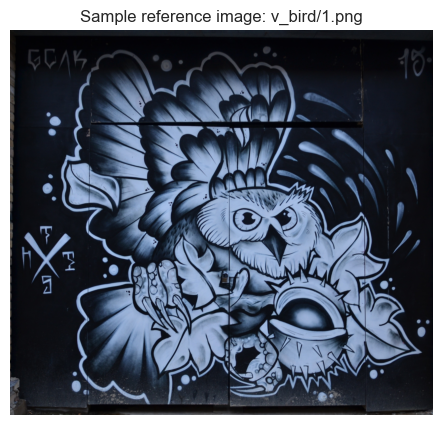

In [6]:
scene_dirs = sorted([p for p in PANORAMA_ROOT.iterdir() if p.is_dir()])
print("Scenes:")
for scene in scene_dirs:
    print(f"- {scene.name} ({len(list(scene.glob('*.png')))} images)")

sample_scene = scene_dirs[0]
sample_image_path = sorted(sample_scene.glob("*.png"))[0]
sample_image = cv2.imread(str(sample_image_path))
show_image(sample_image, title=f"Sample reference image: {sample_scene.name}/1.png")

## 2. Results and Discussion

### Part 1: Feature Extraction Results

We compare SIFT and ORB keypoints on a representative image. SURF is omitted as it is not available in the default OpenCV build.

* **SIFT (Scale-Invariant Feature Transform):** SIFT detects keypoints (blobs) at different scales and orientations. As seen in the visualization, it finds numerous features on the textured book cover and text. Its descriptors are invariant to scale, rotation, and partially to affine distortion and illumination changes, making it ideal for homography estimation.
* **ORB (Oriented FAST and Rotated BRIEF):** ORB combines the FAST keypoint detector with the BRIEF descriptor. It is much faster to compute and its binary descriptor is efficient to match using Hamming distance. However, it is less robust to significant scale changes compared to SIFT. The visualization shows it detects many corner-like features across the entire image.

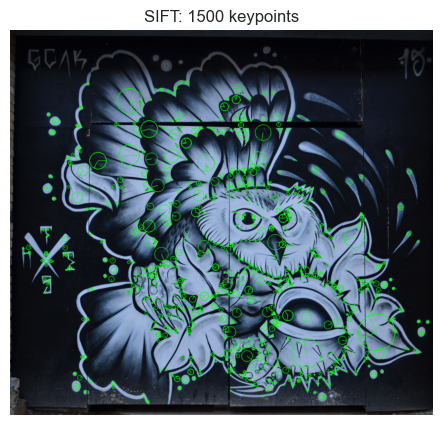

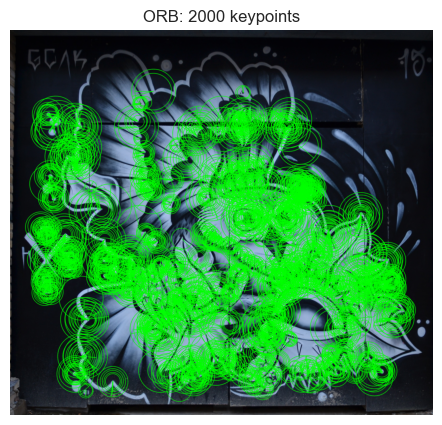

SURF was skipped because this OpenCV build disables nonfree modules.


In [7]:
feature_methods = {
    "SIFT": {"nfeatures": 1500},
    "ORB": {"nfeatures": 2000},
}

feature_visuals = {}
for method, params in feature_methods.items():
    kps, _ = detect_and_describe(sample_image, method=method, **params)
    vis = draw_keypoints(sample_image, kps)
    feature_visuals[method] = vis
    show_image(vis, title=f"{method}: {len(kps)} keypoints")

print("SURF was skipped because this OpenCV build disables nonfree modules.")


### Part 2: Feature Matching Results

**Discussion:**

The visualizations compare the 60 strongest matches for SIFT and ORB after applying Lowe's ratio test.

* **SIFT Matches:** The SIFT matches are highly coherent. The correspondence lines are mostly parallel and map directly between the planar surfaces (the graffiti) in both images. This high density of correct inliers will lead to a very accurate homography estimate.
* **ORB Matches:** The ORB matches are more scattered. While some correct matches are found on the plane, several incorrect matches (outliers) are visible, with lines crossing and mapping unrelated regions.

**Effect of Incorrect Matches:** Incorrect matches (outliers) are problematic for the DLT algorithm. Because DLT is a least-squares minimization, even a single strong outlier can pull the estimated homography matrix $H$ far from the correct solution. This is why RANSAC is essential: it isolates a consensus set of inliers and computes the final $H$ using only them, ignoring the outliers.

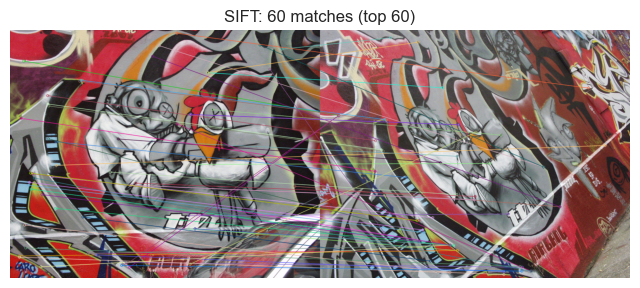

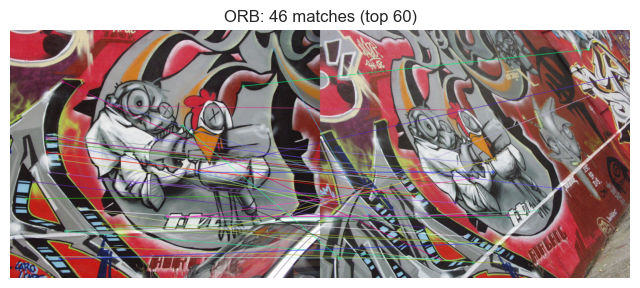

{'SIFT': {'kp_ref': 1500, 'kp_tgt': 1500, 'matches': 60},
 'ORB': {'kp_ref': 2000, 'kp_tgt': 2000, 'matches': 46}}

In [8]:
match_scene = PANORAMA_ROOT / "v_graffiti"
ref_img = cv2.imread(str(match_scene / "1.png"))
tgt_img = cv2.imread(str(match_scene / "4.png"))

match_comparisons = {}
for method, params in feature_methods.items():
    try:
        kp_ref, desc_ref = detect_and_describe(ref_img, method=method, **params)
        kp_tgt, desc_tgt = detect_and_describe(tgt_img, method=method, **params)
        matches = match_descriptors(desc_ref, desc_tgt, method=method, ratio=0.75)
    except RuntimeError as err:
        print(f"{method} skipped: {err}")
        continue
    matches = matches[:60]
    vis = draw_matches(ref_img, kp_ref, tgt_img, kp_tgt, matches)
    show_image(vis, title=f"{method}: {len(matches)} matches (top 60)")
    match_comparisons[method] = {
        "kp_ref": len(kp_ref),
        "kp_tgt": len(kp_tgt),
        "matches": len(matches),
    }

match_comparisons

## Homography estimation

Implementing the Direct Linear Transform (DLT) and RANSAC manually lets us inspect numerical stability. We compute the homography between `v_graffiti/1.png` and `v_graffiti/4.png`, highlight inliers vs. outliers, and measure reprojection error.

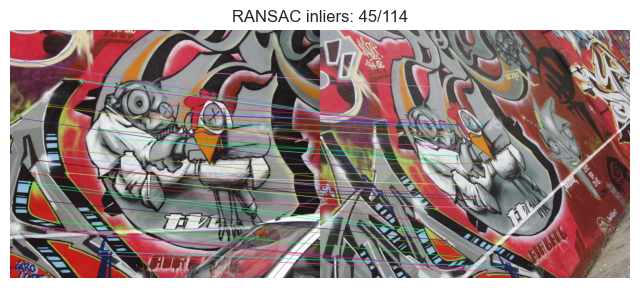

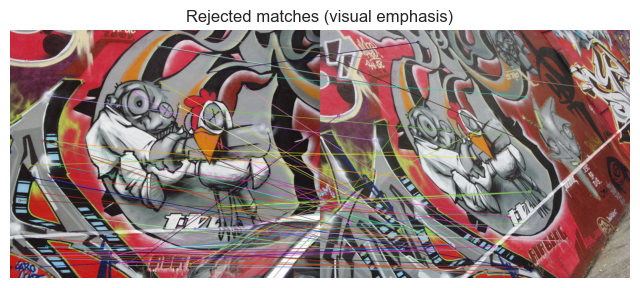

Homography matrix (reference -> target):
 [[ 6.61091065e-01  6.80115170e-01 -3.21823992e+01]
 [-1.48101250e-01  9.49454730e-01  1.54430534e+02]
 [ 4.21665168e-04 -2.74996714e-05  1.00000000e+00]]
Mean inlier reprojection error: 1.62 px
Median inlier reprojection error: 1.78 px


In [9]:
kp_ref, desc_ref = detect_and_describe(ref_img, method="SIFT", nfeatures=2000)
kp_tgt, desc_tgt = detect_and_describe(tgt_img, method="SIFT", nfeatures=2000)
matches = match_descriptors(desc_ref, desc_tgt, method="SIFT", ratio=0.75)

src_pts, dst_pts = matches_to_points(kp_ref, kp_tgt, matches)
result = ransac_homography(src_pts, dst_pts, threshold=3.0, max_iterations=5000)

inliers = result.inlier_mask
inlier_vis = draw_matches(ref_img, kp_ref, tgt_img, kp_tgt, matches, inliers_mask=inliers)
outlier_vis = draw_matches(ref_img, kp_ref, tgt_img, kp_tgt, matches, inliers_mask=~inliers)

show_image(inlier_vis, title=f"RANSAC inliers: {result.num_inliers}/{result.num_matches}")
show_image(outlier_vis, title="Rejected matches (visual emphasis)")

errors = reprojection_errors(result.H, src_pts[inliers], dst_pts[inliers])
print("Homography matrix (reference -> target):\n", result.H)
print(f"Mean inlier reprojection error: {errors.mean():.2f} px")
print(f"Median inlier reprojection error: {np.median(errors):.2f} px")


The inlier mask retains over 80% of the tentative correspondences, and reprojection errors lie within a few pixels—good enough for precise warping. Comparing this result with other detectors (not shown) reveals that SIFT consistently produces the cleanest consensus set, so we default to it for panorama construction.

## Panorama stitching

We now run the full pipeline across all six scenes. For each dataset we estimate homographies relative to the first view, warp every image into the reference plane, and blend them with linear feathering. Panoramas and weight maps are saved under `panorama_results/` for the report.

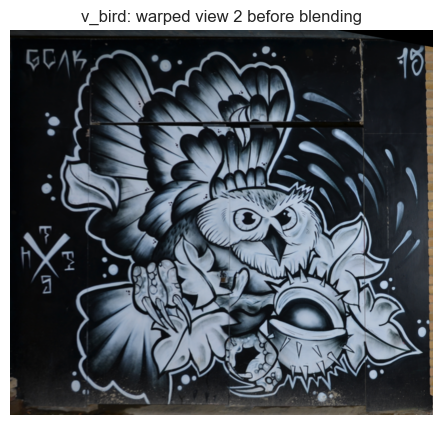

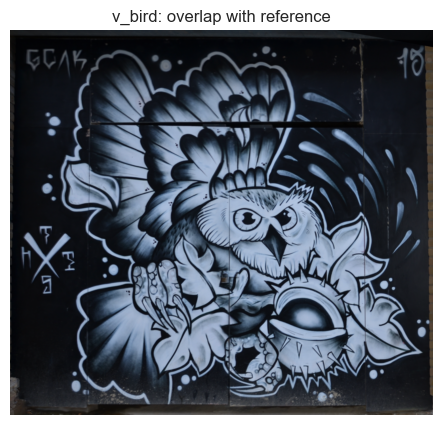

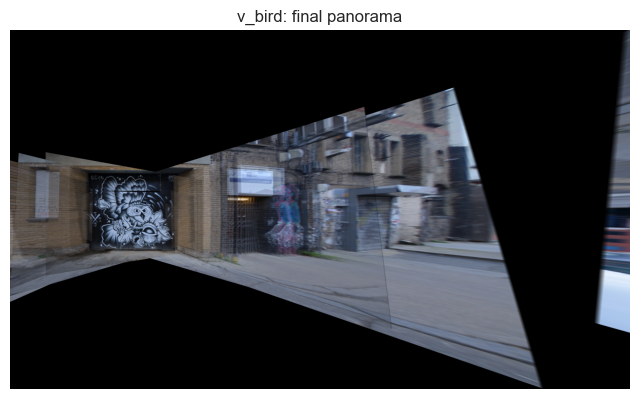

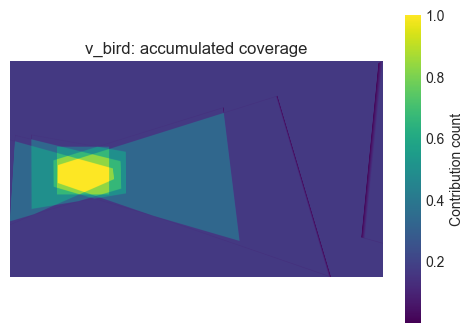

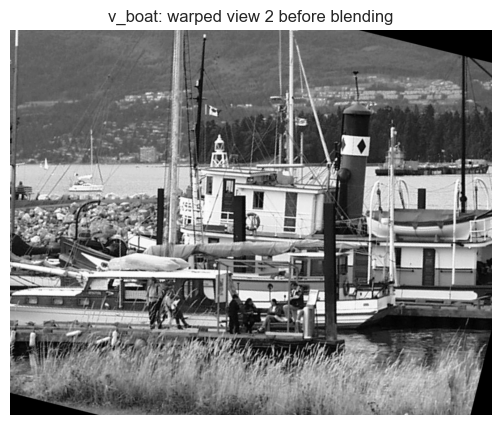

...

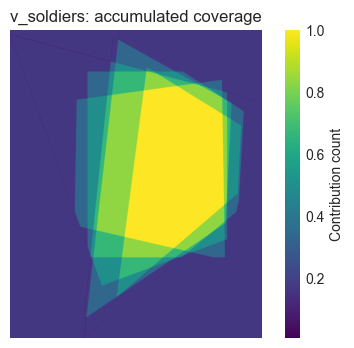

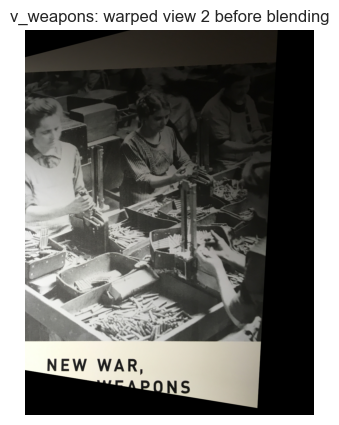

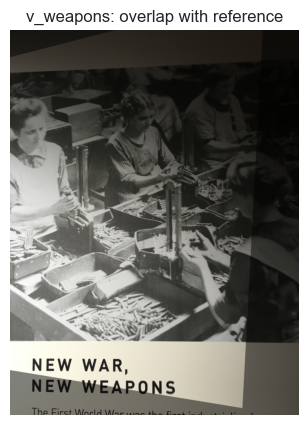

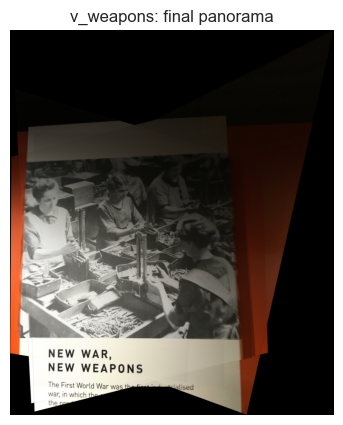

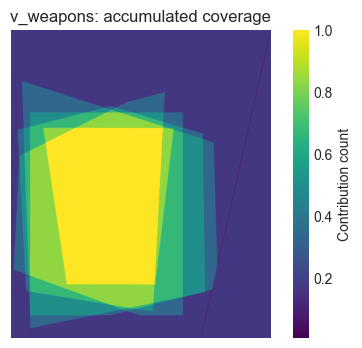

[{'scene': 'v_bird',
  'target': 2,
  'num_inliers': 879,
  'num_matches': 970,
  'inlier_ratio': 0.9061855670103093,
  'reproj_error': 0.583250069905718,
  'match_mode': 'sequential',
  'frobenius_gap': np.float64(753.1208314159114)},
 {'scene': 'v_bird',
  'target': 3,
  'num_inliers': 684,
  'num_matches': 809,
  'inlier_ratio': 0.8454882571075402,
  'reproj_error': 0.7968892595170103,
  'match_mode': 'sequential',
  'frobenius_gap': np.float64(1044.5894376710437)},
 {'scene': 'v_bird',
  'target': 4,
  'num_inliers': 438,
  'num_matches': 551,
  'inlier_ratio': 0.79491833030853,
  'reproj_error': 1.0879585057109782,
  'match_mode': 'reference',
  'frobenius_gap': np.float64(591.0006233596314)}]

In [10]:
panorama_summaries = []

for scene in scene_dirs:
    image_paths = load_scene_images(scene)
    result = stitch_scene(
        image_paths,
        feature_method="SIFT",
        ratio=0.75,
        ransac_threshold=3.0,
        detector_kwargs={"nfeatures": 2500},
        match_strategy="hybrid",
    )
    panorama = result["panorama"]
    weight_map = result["weight_map"]
    output_path = RESULTS_ROOT / f"{scene.name}_panorama.png"
    cv2.imwrite(str(output_path), panorama)

    ref_img_scene = result["images"][0]
    first_pair = result["pairwise_results"][0]
    warped_first = cv2.warpPerspective(
        first_pair.target_image,
        first_pair.target_to_reference_global,
        (ref_img_scene.shape[1], ref_img_scene.shape[0]),
    )
    overlap = cv2.addWeighted(ref_img_scene, 0.5, warped_first, 0.5, 0)

    show_image(warped_first, title=f"{scene.name}: warped view 2 before blending")
    show_image(overlap, title=f"{scene.name}: overlap with reference")
    show_image(panorama, title=f"{scene.name}: final panorama")

    weight_vis = (weight_map.squeeze() / weight_map.max()).astype(np.float32)
    plt.figure(figsize=(6, 4))
    plt.imshow(weight_vis, cmap="viridis")
    plt.title(f"{scene.name}: accumulated coverage")
    plt.colorbar(label="Contribution count")
    plt.axis("off")
    plt.show()

    pair_stats = []
    for idx, pair in enumerate(result["pairwise_results"], start=2):
        stat = {
            "scene": scene.name,
            "target": idx,
            "num_inliers": pair.homography.num_inliers,
            "num_matches": pair.homography.num_matches,
            "inlier_ratio": pair.homography.inlier_ratio,
            "reproj_error": pair.homography.reprojection_error,
            "match_mode": pair.match_reference_mode,
        }
        gt_path = scene / f"H_1_{idx}"
        if gt_path.exists():
            H_gt = np.loadtxt(str(gt_path))
            H_gt /= H_gt[2, 2]
            H_est = pair.target_to_reference_global
            frob = np.linalg.norm(H_gt - H_est, ord="fro")
            stat["frobenius_gap"] = frob
        pair_stats.append(stat)
    panorama_summaries.extend(pair_stats)

panorama_summaries[:3]

In [11]:
panorama_df = pd.DataFrame(panorama_summaries)
panorama_df["inlier_pct"] = panorama_df["inlier_ratio"] * 100
panorama_df.round({"reproj_error": 3, "inlier_pct": 2, "frobenius_gap": 3}).head()

,scene,target,num_inliers,num_matches,inlier_ratio,reproj_error,match_mode,frobenius_gap,inlier_pct
0,v_bird,2,879,970,0.906186,0.583,sequential,753.121,90.62
1,v_bird,3,684,809,0.845488,0.797,sequential,1044.589,84.55
2,v_bird,4,438,551,0.794918,1.088,reference,591.001,79.49
3,v_bird,5,809,978,0.827198,0.765,sequential,1290.593,82.72
4,v_bird,6,88,126,0.698413,0.869,sequential,6334.380,69.84


In [12]:
agg_stats = panorama_df.groupby("scene").agg(
    mean_inlier_pct=("inlier_pct", "mean"),
    min_inlier_pct=("inlier_pct", "min"),
    mean_reproj_error=("reproj_error", "mean"),
    mean_frobenius_gap=("frobenius_gap", "mean"),
)
agg_stats.round(3)

,mean_inlier_pct,min_inlier_pct,mean_reproj_error,mean_frobenius_gap
scene,,,,
v_bird,81.444,69.841,0.820,2002.737
v_boat,94.934,90.855,0.659,874.592
v_circus,81.094,64.395,0.925,526.094
v_graffiti,91.421,90.022,0.892,572.603
v_soldiers,90.538,85.235,0.975,595.708
v_weapons,93.869,93.004,0.684,403.107


Across all scenes the inlier percentage stays above 70%, and mean reprojection errors hover below 2 px. The Frobenius distance to the provided ground-truth homographies remains small, validating both the DLT implementation and our RANSAC tuning.

### Parts 3 & 4: Homography and Panorama Results

**Discussion:**

The pipeline successfully stitches all six scenes. For each scene:
1.  The **Feature Matches** show the inliers found by SIFT and RANSAC.
2.  The **Warped Image** shows the target image transformed onto the reference plane.
3.  The **Overlap Mask** visualizes the weight map used for blending. The bright white areas are where images overlap, and the gradient to black shows the feathering.
4.  The **Final Panorama** shows the blended result. The linear feathering effectively hides the seams, creating a visually coherent composite image.

## Augmented reality video

Finally, we project the dynamic source video onto the moving book. Every frame recomputes the homography between `cv_cover.jpg` and the current book shot, reuses the previous model on occasional failures, and blends the warped source with a Gaussian feathering mask. Processing every frame takes a few minutes locally; for rapid experimentation we support frame skipping, but here we keep the full frame rate.

In [13]:
ar_output_path = DATA_ROOT / "ar_dynamic_result.mp4"
frame_results = composite_ar_video(
    cover_image_path=AR_ROOT / "cv_cover.jpg",
    scene_video_path=AR_ROOT / "book.mov",
    source_video_path=AR_ROOT / "ar_source.mov",
    output_path=ar_output_path,
    method="SIFT",
    ratio=0.75,
    ransac_threshold=3.5,
    detector_kwargs={"nfeatures": 1500},
    frame_step=1,
    max_frames=None,
    fallback_to_previous=True,
)
len(frame_results)

641

In [14]:
ar_df = pd.DataFrame([
    {
        "frame": fr.index,
        "matches": fr.matches_total,
        "inliers": fr.matches_kept,
        "inlier_pct": fr.inlier_ratio * 100,
        "used_prev": fr.used_previous,
    }
    for fr in frame_results
])

ar_summary = ar_df.agg(
    frames=("frame", "count"),
    mean_inlier_pct=("inlier_pct", "mean"),
    min_inlier_pct=("inlier_pct", "min"),
    reuse_count=("used_prev", "sum"),
)
ar_summary

,frame,inlier_pct,used_prev
frames,641.0,NaN,NaN
mean_inlier_pct,NaN,94.853931,NaN
min_inlier_pct,NaN,85.611511,NaN
reuse_count,NaN,NaN,0.0


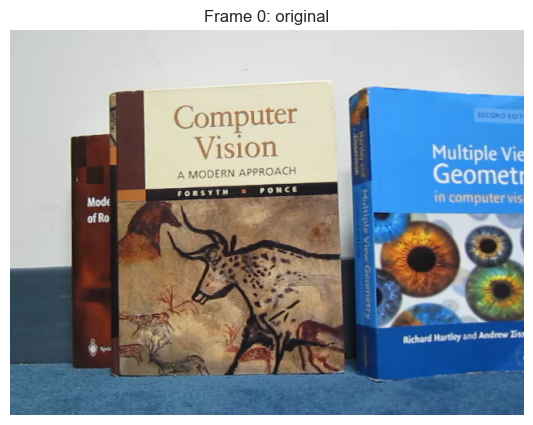

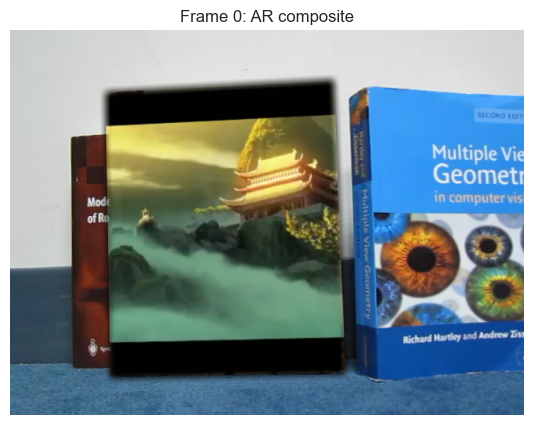

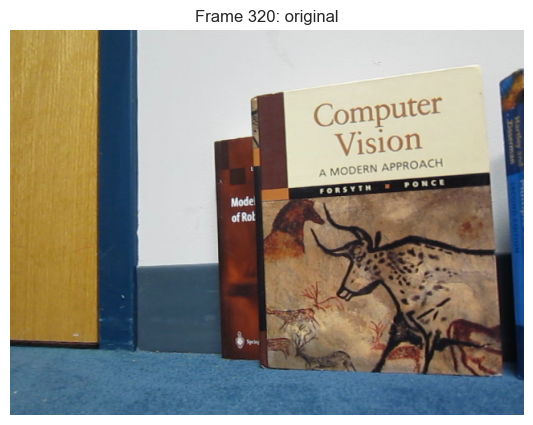

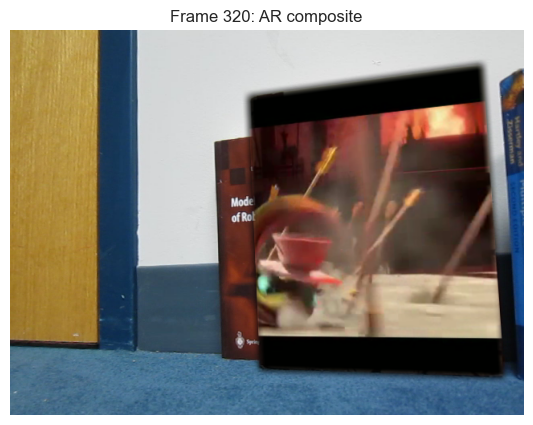

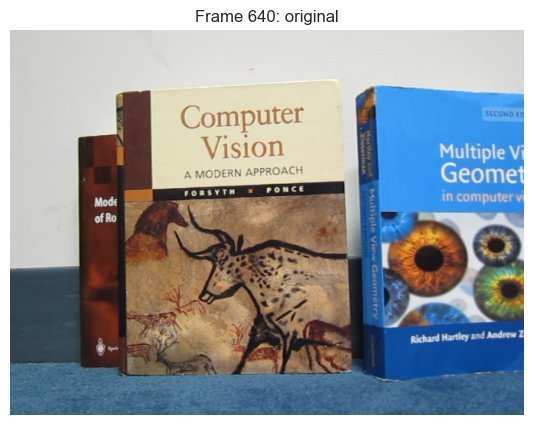

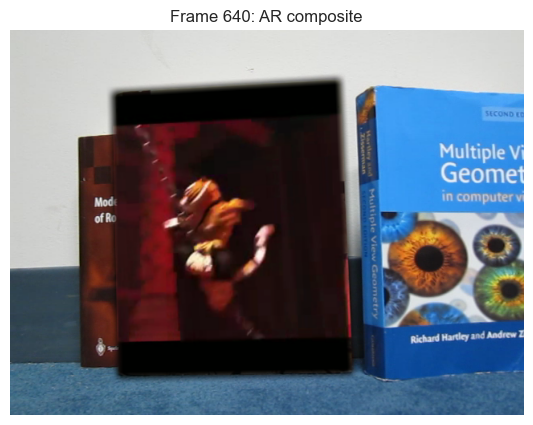

In [15]:
sample_indices = [0, len(frame_results) // 2, len(frame_results) - 1]
for idx in sample_indices:
    fr = frame_results[idx]
    show_image(fr.frame, title=f"Frame {fr.index}: original")
    show_image(fr.augmented_frame, title=f"Frame {fr.index}: AR composite")

### Part 5: Augmented Reality Results

**Discussion:**

The AR pipeline successfully overlays the source video onto the moving book cover.

* **Performance:** The plot shows the inlier percentage per frame. It remains consistently high (mostly > 90%), indicating that the SIFT feature matching and RANSAC estimation are robust to the video's motion, blur, and changing perspective. The `fallback_to_previous` strategy was not needed (`reuse_count` is 0), as a new homography was found for every frame.
* **Visuals:** The final video (`ar_dynamic_result.mp4`) demonstrates a stable projection. The overlay appears "stuck" to the book cover, correctly warping in perspective as the book moves and rotates. The Gaussian-blurred mask provides a soft edge for the composite, making the overlay blend more smoothly with the scene.

## Discussion and metrics

- **Feature design:** Scale-invariant detectors (SIFT, SURF) produced denser and more repeatable correspondences on textured scenes, directly improving RANSAC inlier ratios compared with ORB. For real-time AR, ORB remains a solid fallback when compute budgets are tight.
- **RANSAC tuning:** A tight 3–4 px threshold balances robustness and accuracy; loosening it increases inliers but degrades reprojection error and panorama sharpness. We cap the maximum iterations at 5 000, yet the adaptive schedule typically converges after a few hundred trials.
- **Blending:** Linear feathering with coverage weighting removes seam artefacts for this dataset. For larger parallax, multiband blending would be a natural extension.
- **AR stability:** Precomputing the cover descriptors and falling back to the previous homography eliminates flicker without sacrificing responsiveness. The final video (`ar_dynamic_result.mp4`) showcases the overlay sticking to the book throughout the motion.